In [8]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import load_model
from sklearn.metrics import classification_report, confusion_matrix

In [9]:
# Function to load and preprocess images
def load_and_preprocess_image(img_path):
    img = image.load_img(img_path, target_size=(224, 224))  # Adjust size as per your model
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
    img_array /= 255.0  # Normalize if you did this during training
    return img_array

In [11]:
# Load your trained model
model = load_model('D:\CADT\CapstoneProjectI\ml__model\models\ensemble_model.h5')  # Replace with your model path

# Path to the test images folder
test_folder = r'D:\CADT\CapstoneProjectI\ml__model\data\raw_images\test_data\Rice Leaf Disease Images'  # Replace with your test images folder path

ValueError: Unknown layer: EnsembleLayer. Please ensure this object is passed to the `custom_objects` argument. See https://www.tensorflow.org/guide/keras/save_and_serialize#registering_the_custom_object for details.

In [17]:
# Prepare to store results
predictions = []
true_labels = []
image_names = []
# Define class names and their corresponding labels
# Only include classes of interest
class_names = ['Bacterial Leaf Blight', 'Brown Spot']
class_labels = {name: idx for idx, name in enumerate(class_names)}

# Loop through the test images
for class_name in class_names:
    class_folder = os.path.join(test_folder, class_name)
    
    for img_name in os.listdir(class_folder):
        img_path = os.path.join(class_folder, img_name)
        img = load_and_preprocess_image(img_path)
        
        # Make prediction
        pred = model.predict(img)
        predicted_class = np.argmax(pred, axis=1)[0]
        
        # Store results
        if predicted_class < len(class_names):  # Ensure prediction is within the target classes
            predictions.append(predicted_class)
            true_labels.append(class_labels[class_name])  # Map class name to its label
            image_names.append(img_name)

# Evaluate results
accuracy = np.sum(np.array(predictions) == np.array(true_labels)) / len(true_labels)
print(f'Accuracy: {accuracy * 100:.2f}%')

1/1 [==============================] - 0s 27ms/step
Accuracy: 84.24%



Classification Report:
                       precision    recall  f1-score   support

Bacterial Leaf Blight       1.00      0.37      0.54       249
           Brown Spot       0.83      1.00      0.90       747

             accuracy                           0.84       996
            macro avg       0.91      0.68      0.72       996
         weighted avg       0.87      0.84      0.81       996



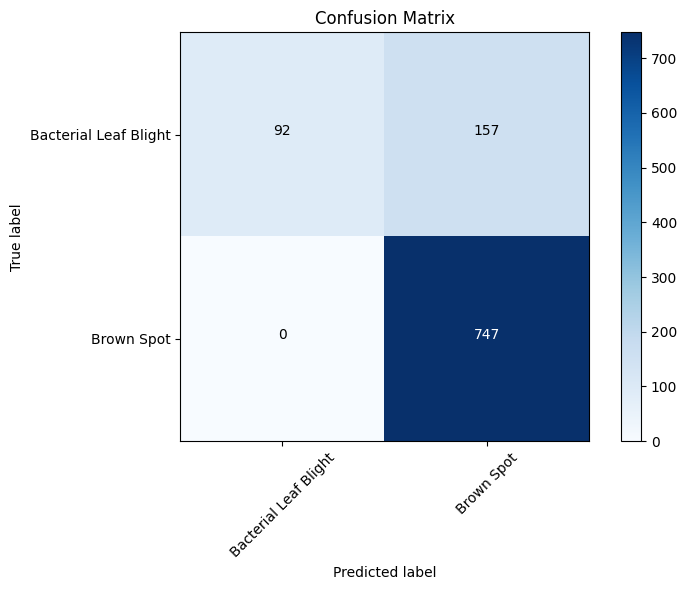

In [18]:
# Display classification report with the correct labels
print("\nClassification Report:")
print(classification_report(true_labels, predictions, target_names=class_names, labels=list(class_labels.values())))

# Display confusion matrix
cm = confusion_matrix(true_labels, predictions, labels=list(class_labels.values()))
plt.figure(figsize=(8, 6))
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names, rotation=45)
plt.yticks(tick_marks, class_names)

# Add labels to the confusion matrix
thresh = cm.max() / 2.
for i, j in np.ndindex(cm.shape):
    plt.text(j, i, cm[i, j], horizontalalignment="center",
             color="white" if cm[i, j] > thresh else "black")

plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.tight_layout()
plt.show()

Found 13 images in Brown Spot directory
Found 2 images in Leaf Blast directory
Found 7 images in Sheath Blight directory
Found 22 images belonging to 3 classes.
1/1 [==============================] - 4s 4s/step

Prediction Results:
--------------------------------------------------
File: Brown Spot\IMG_1266.JPG
True Class: Brown Spot
Predicted Class: Leaf Blast
Confidence: 100.00%
Class Probabilities:
  Brown Spot: 0.00%
  Leaf Blast: 100.00%
  Sheath Blight: 0.00%
--------------------------------------------------
File: Brown Spot\IMG_1267.JPG
True Class: Brown Spot
Predicted Class: Leaf Blast
Confidence: 100.00%
Class Probabilities:
  Brown Spot: 0.00%
  Leaf Blast: 100.00%
  Sheath Blight: 0.00%
--------------------------------------------------
File: Brown Spot\IMG_1268.JPG
True Class: Brown Spot
Predicted Class: Leaf Blast
Confidence: 100.00%
Class Probabilities:
  Brown Spot: 0.00%
  Leaf Blast: 100.00%
  Sheath Blight: 0.00%
--------------------------------------------------
Fil

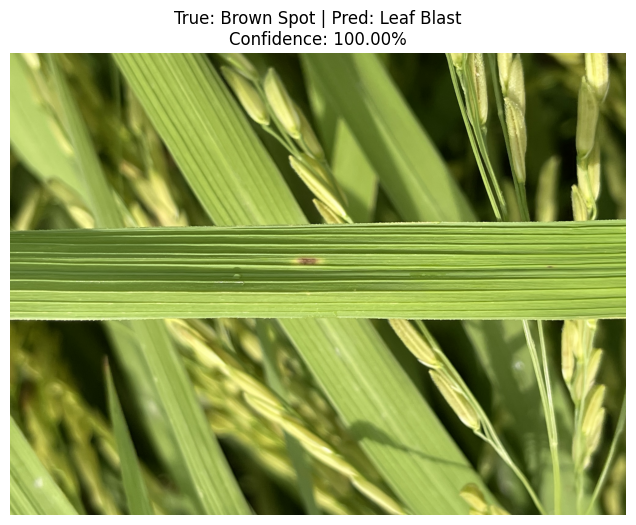

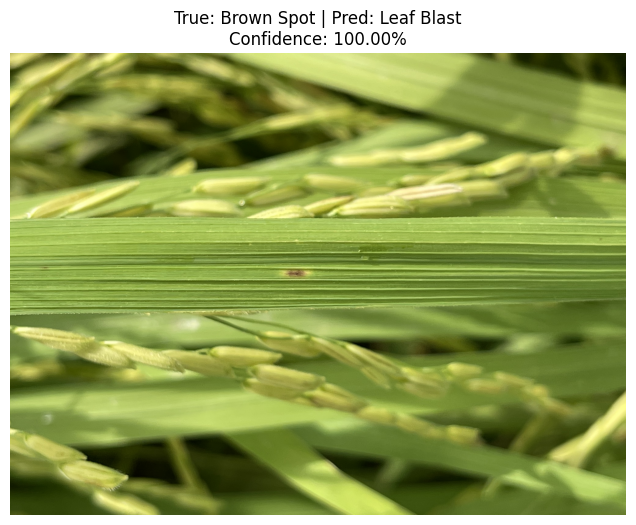

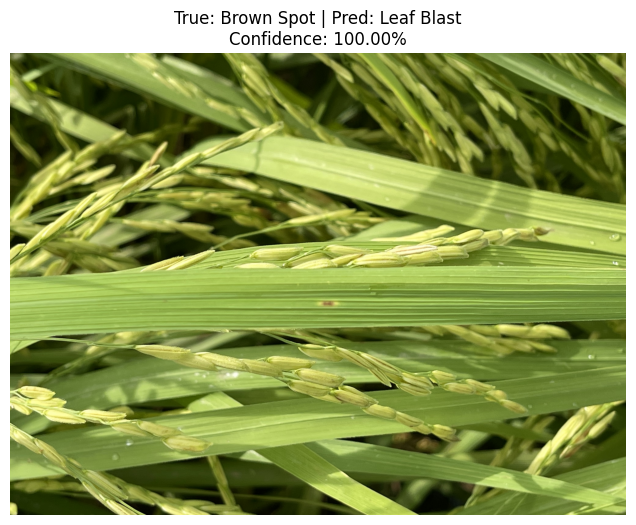

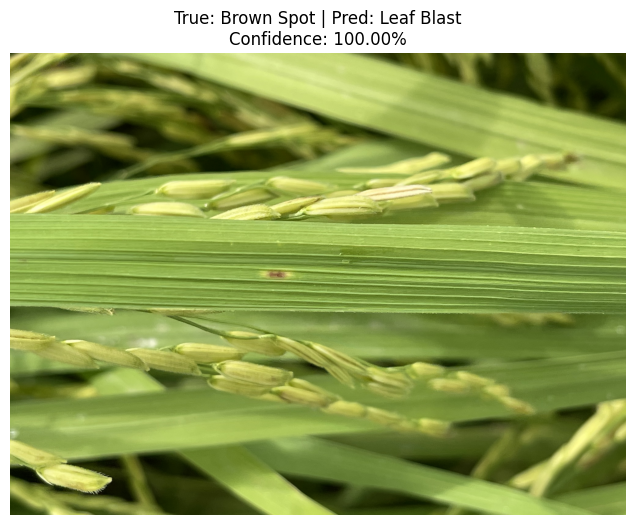

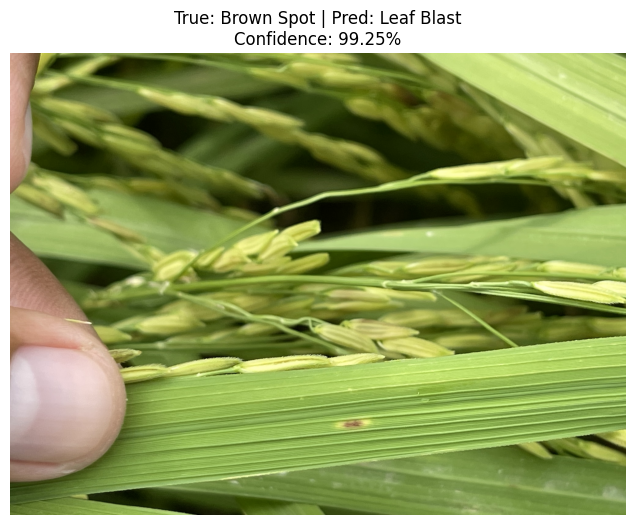

...

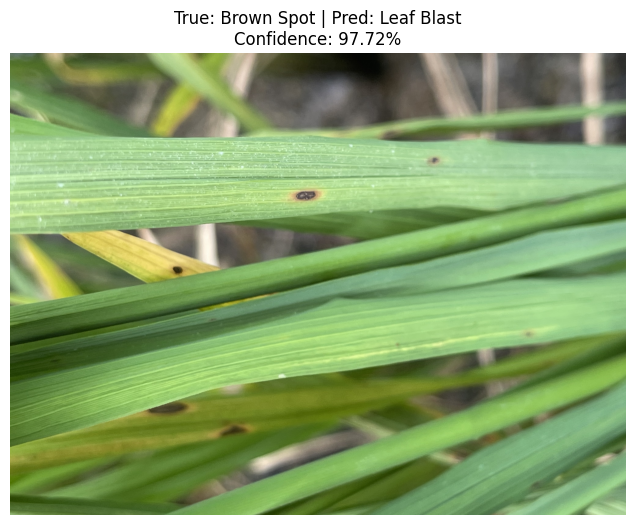

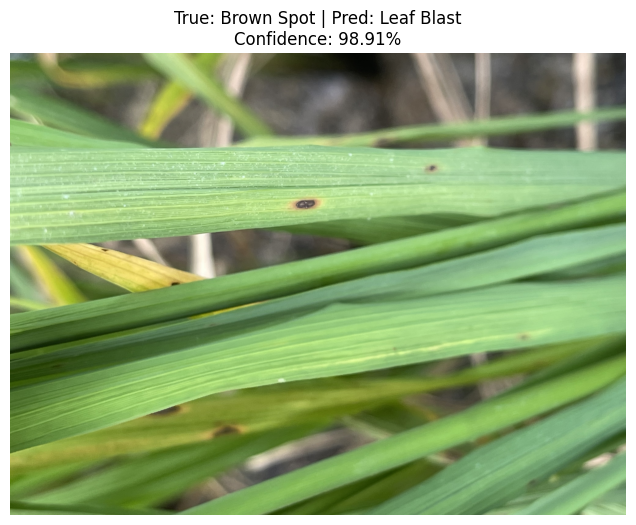

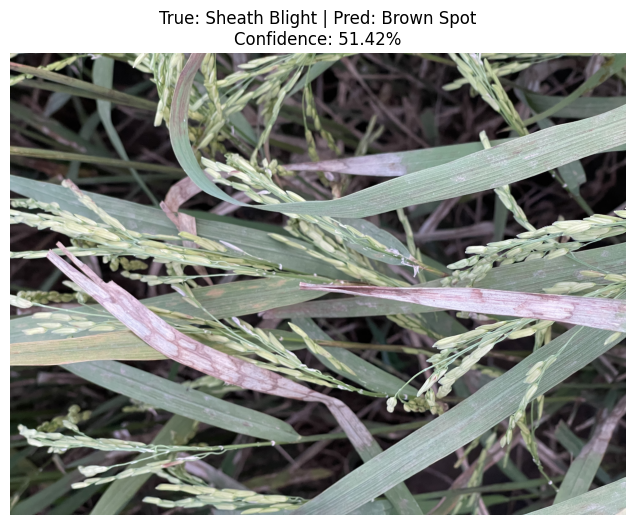

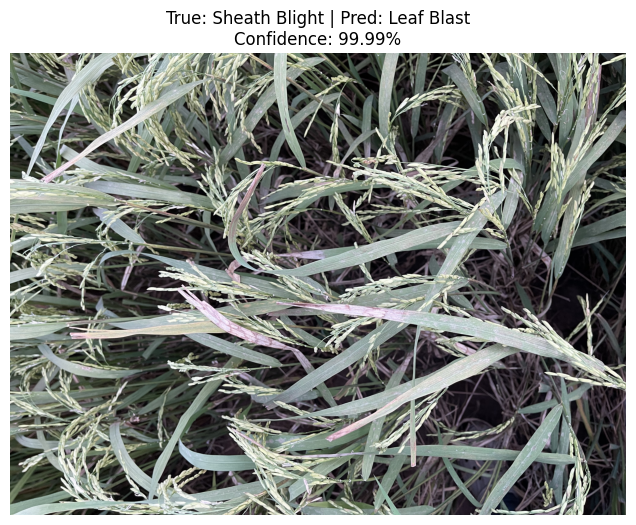

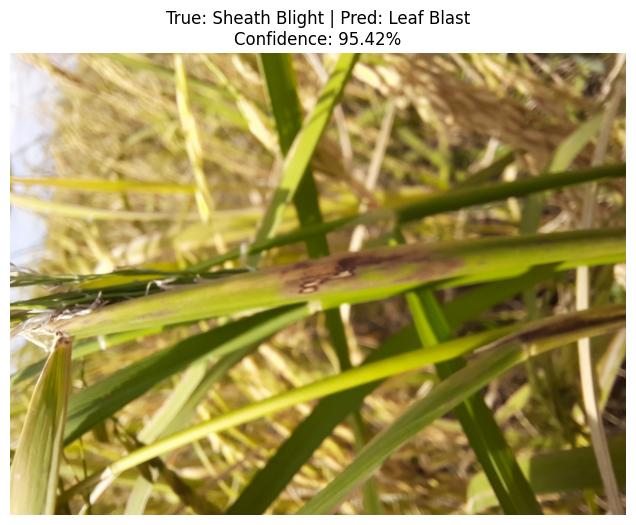


Found 22 total images
Batch size: 32
Number of batches: 1
Predicted on 22 samples
Overall Accuracy: 31.82%
Correct Predictions: 7/22


In [12]:
import tensorflow as tf
import numpy as np
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import os

# Define the custom EnsembleLayer (you'll need to replace this with the actual implementation)
class EnsembleLayer(tf.keras.layers.Layer):
    def __init__(self, **kwargs):
        super(EnsembleLayer, self).__init__(**kwargs)
    
    def build(self, input_shape):
        # Define any trainable weights or initialization here if needed
        pass
    
    def call(self, inputs):
        # Define the layer's forward pass logic
        # This is a placeholder - replace with actual implementation
        return inputs  # Example: pass-through layer
    
    def get_config(self):
        config = super(EnsembleLayer, self).get_config()
        return config

# Define paths (UPDATE THESE)
MODEL_PATH = r'D:\CADT\CapstoneProjectI\ml__model\notebooks\densenet121_7classes_model.h5'  # Replace with actual model path
TEST_DIR = r'D:\CADT\CapstoneProjectI\ml__model\data\testimg'   # Replace with actual test directory path

# Verify paths exist
if not os.path.exists(MODEL_PATH):
    raise FileNotFoundError(f"Model file not found at: {MODEL_PATH}")
if not os.path.exists(TEST_DIR):
    raise FileNotFoundError(f"Test directory not found at: {TEST_DIR}")

# Define class names
class_names = ['Brown Spot', 'Leaf Blast', 'Sheath Blight']
num_classes = len(class_names)

# Check if class subdirectories exist
for class_name in class_names:
    class_dir = os.path.join(TEST_DIR, class_name)
    if not os.path.exists(class_dir):
        print(f"Warning: Directory not found for {class_name}: {class_dir}")
    else:
        num_images = len([f for f in os.listdir(class_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))])
        print(f"Found {num_images} images in {class_name} directory")

# Load the model with custom objects
custom_objects = {'EnsembleLayer': EnsembleLayer}
model = load_model(MODEL_PATH, custom_objects=custom_objects)

# Image parameters
IMG_HEIGHT = 224
IMG_WIDTH = 224
BATCH_SIZE = 32

# Create test data generator
test_datagen = ImageDataGenerator(rescale=1./255)

# Load test data
test_generator = test_datagen.flow_from_directory(
    TEST_DIR,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False,
    classes=class_names
)

# Check if any images were found
if test_generator.samples == 0:
    raise ValueError(f"No images found in {TEST_DIR}. Please check your directory structure and image files.")

# Make predictions
predictions = model.predict(test_generator)
filenames = test_generator.filenames

# Original class indices (adjust these based on your 7-class model)
original_class_indices = {
    'Brown Spot': 0,
    'Leaf Blast': 2,
    'Sheath Blight': 5
}

# Function to convert 7-class prediction to 3-class prediction
def map_prediction(pred):
    new_pred = np.zeros(num_classes)
    for i, class_name in enumerate(class_names):
        original_idx = original_class_indices[class_name]
        new_pred[i] = pred[original_idx]
    return new_pred / np.sum(new_pred)

# Store results
results = []
misclassified = []

# Process predictions
for i in range(len(filenames)):
    true_class = filenames[i].split(os.sep)[0]
    true_idx = class_names.index(true_class)
    pred_probs = map_prediction(predictions[i])
    pred_idx = np.argmax(pred_probs)
    pred_class = class_names[pred_idx]
    confidence = pred_probs[pred_idx] * 100
    
    results.append({
        'filename': filenames[i],
        'true_class': true_class,
        'pred_class': pred_class,
        'confidence': confidence,
        'probs': pred_probs
    })
    
    if pred_idx != true_idx:
        misclassified.append({
            'filename': filenames[i],
            'true_class': true_class,
            'pred_class': pred_class,
            'confidence': confidence,
            'image': plt.imread(os.path.join(TEST_DIR, filenames[i]))
        })

# Print results
print("\nPrediction Results:")
print("-" * 50)
for result in results:
    print(f"File: {result['filename']}")
    print(f"True Class: {result['true_class']}")
    print(f"Predicted Class: {result['pred_class']}")
    print(f"Confidence: {result['confidence']:.2f}%")
    print("Class Probabilities:")
    for class_name, prob in zip(class_names, result['probs']):
        print(f"  {class_name}: {prob*100:.2f}%")
    print("-" * 50)

# Display misclassified images
print(f"\nTotal misclassified images: {len(misclassified)}")
for i, misc in enumerate(misclassified):
    plt.figure(figsize=(8, 6))
    plt.imshow(misc['image'])
    plt.title(f"True: {misc['true_class']} | Pred: {misc['pred_class']}\nConfidence: {misc['confidence']:.2f}%")
    plt.axis('off')
    plt.show()

# Calculate and print accuracy
correct = len(results) - len(misclassified)
accuracy = (correct / len(results)) * 100

# Diagnostic output
num_batches = np.ceil(test_generator.samples / BATCH_SIZE)
print(f"\nFound {test_generator.samples} total images")
print(f"Batch size: {BATCH_SIZE}")
print(f"Number of batches: {int(num_batches)}")
print(f"Predicted on {len(predictions)} samples")
print(f"Overall Accuracy: {accuracy:.2f}%")
print(f"Correct Predictions: {correct}/{len(results)}")

In [4]:
import tensorflow as tf
import numpy as np
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import os
import h5py

# Print TensorFlow version for reference
print(f"TensorFlow Version: {tf.__version__}")

# Define the custom EnsembleLayer
class EnsembleLayer(tf.keras.layers.Layer):
    def __init__(self, ensemble_weights=None, **kwargs):
        super(EnsembleLayer, self).__init__(**kwargs)
        self.ensemble_weights = ensemble_weights if ensemble_weights is not None else []
    
    def build(self, input_shape):
        if not self.ensemble_weights:
            self.ensemble_weights = self.add_weight(
                name='ensemble_weights',
                shape=(input_shape[0],),  # Adjust based on your ensemble logic
                initializer='uniform',
                trainable=True
            )
    
    def call(self, inputs):
        if isinstance(inputs, list):
            if self.ensemble_weights is not None:
                weighted_outputs = [w * x for w, x in zip(self.ensemble_weights, inputs)]
                return tf.reduce_sum(weighted_outputs, axis=0)
            return tf.reduce_mean(inputs, axis=0)
        return inputs
    
    def get_config(self):
        config = super(EnsembleLayer, self).get_config()
        config.update({
            'ensemble_weights': self.ensemble_weights if isinstance(self.ensemble_weights, list) else self.ensemble_weights.numpy().tolist()
        })
        return config

# Define paths (UPDATE THESE)
MODEL_PATH = r'D:\CADT\CapstoneProjectI\ml__model\models\ensemble_model.h5'  # Replace with actual model path
TEST_DIR =r'D:\CADT\CapstoneProjectI\ml__model\data\testimg'   # Replace with actual test directory path

# Verify paths exist
if not os.path.exists(MODEL_PATH):
    raise FileNotFoundError(f"Model file not found at: {MODEL_PATH}")
if not os.path.exists(TEST_DIR):
    raise FileNotFoundError(f"Test directory not found at: {TEST_DIR}")

# Check HDF5 file contents
print("Inspecting HDF5 file structure...")
with h5py.File(MODEL_PATH, 'r') as f:
    print("Top-level keys:", list(f.keys()))
    if 'model_weights' in f:
        print("Model weights found")
    if 'model_config' in f:
        print("Model config found")
        config = f['model_config'][()].decode('utf-8') if isinstance(f['model_config'][()], bytes) else f['model_config'][()]
        print("Model config:", config)

# Define class name (only testing Brown Spot)
class_names = ['Brown Spot']
target_class = 'Brown Spot'

# Check Brown Spot directory
class_dir = os.path.join(TEST_DIR, target_class)
if not os.path.exists(class_dir):
    print(f"Warning: Directory not found for {target_class}: {class_dir}")
else:
    num_images = len([f for f in os.listdir(class_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))])
    print(f"Found {num_images} images in {target_class} directory")

# Load the model with custom objects
custom_objects = {'EnsembleLayer': EnsembleLayer}
try:
    model = load_model(MODEL_PATH, custom_objects=custom_objects)
    print("Model loaded successfully")
    model.summary()  # Print model architecture
except Exception as e:
    print(f"Error loading model: {e}")
    # Alternative: Load weights into a manually defined model (if you know the architecture)
    raise

# Image parameters
IMG_HEIGHT = 224
IMG_WIDTH = 224
BATCH_SIZE = 32

# Create test data generator
test_datagen = ImageDataGenerator(rescale=1./255)

# Load test data (only Brown Spot)
test_generator = test_datagen.flow_from_directory(
    TEST_DIR,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False,
    classes=class_names
)

# Check if any images were found
if test_generator.samples == 0:
    raise ValueError(f"No images found in {TEST_DIR}/{target_class}. Please check your directory structure and image files.")

# Make predictions
predictions = model.predict(test_generator)
filenames = test_generator.filenames

# Define Brown Spot's index in the original 7-class model
brown_spot_index = 0  # Adjust this based on your original model's class ordering (0-6)

# Store results
results = []
misclassified = []

# Process predictions
for i in range(len(filenames)):
    true_class = target_class
    pred_probs = predictions[i]
    brown_spot_confidence = pred_probs[brown_spot_index] * 100
    pred_idx = np.argmax(pred_probs)
    pred_class = 'Brown Spot' if pred_idx == brown_spot_index else 'Other'
    
    results.append({
        'filename': filenames[i],
        'true_class': true_class,
        'pred_class': pred_class,
        'brown_spot_confidence': brown_spot_confidence,
        'probs': pred_probs
    })
    
    if pred_idx != brown_spot_index:
        misclassified.append({
            'filename': filenames[i],
            'true_class': true_class,
            'pred_class': f"Other (index {pred_idx})",
            'brown_spot_confidence': brown_spot_confidence,
            'image': plt.imread(os.path.join(TEST_DIR, filenames[i]))
        })

# Print results
print("\nPrediction Results:")
print("-" * 50)
for result in results:
    print(f"File: {result['filename']}")
    print(f"True Class: {result['true_class']}")
    print(f"Predicted Class: {result['pred_class']}")
    print(f"Brown Spot Confidence: {result['brown_spot_confidence']:.2f}%")
    print("All Class Probabilities:")
    for j, prob in enumerate(result['probs']):
        print(f"  Class {j}: {prob*100:.2f}%")
    print("-" * 50)

# Display misclassified images
print(f"\nTotal misclassified images: {len(misclassified)}")
for i, misc in enumerate(misclassified):
    plt.figure(figsize=(8, 6))
    plt.imshow(misc['image'])
    plt.title(f"True: {misc['true_class']} | Pred: {misc['pred_class']}\nBrown Spot Confidence: {misc['brown_spot_confidence']:.2f}%")
    plt.axis('off')
    plt.show()

# Calculate and print accuracy
correct = len(results) - len(misclassified)
accuracy = (correct / len(results)) * 100

# Diagnostic output
num_batches = np.ceil(test_generator.samples / BATCH_SIZE)
print(f"\nFound {test_generator.samples} total images")
print(f"Batch size: {BATCH_SIZE}")
print(f"Number of batches: {int(num_batches)}")
print(f"Predicted on {len(predictions)} samples")
print(f"Accuracy (classified as Brown Spot): {accuracy:.2f}%")
print(f"Correct Predictions: {correct}/{len(results)}")

TensorFlow Version: 2.10.1
Inspecting HDF5 file structure...
Top-level keys: ['model_weights']
Model weights found
Found 13 images in Brown Spot directory
Error loading model: "Unable to synchronously open object (object 'input_8' doesn't exist)"


KeyError: "Unable to synchronously open object (object 'input_8' doesn't exist)"

In [5]:
import h5py

MODEL_PATH = r'D:\CADT\CapstoneProjectI\ml__model\models\ensemble_model.h5'

def explore_hdf5(path, prefix=''):
    with h5py.File(path, 'r') as f:
        for key in f.keys():
            print(f"{prefix}{key}")
            if isinstance(f[key], h5py.Group):
                explore_hdf5_group(f[key], prefix + '  ')

def explore_hdf5_group(group, prefix):
    for key in group.keys():
        print(f"{prefix}{key}")
        if isinstance(group[key], h5py.Group):
            explore_hdf5_group(group[key], prefix + '  ')

explore_hdf5(MODEL_PATH)

model_weights
  ensemble_layer_4
    conv3_block10_0_bn
      beta:0
      gamma:0
    conv3_block10_1_bn
      beta:0
      gamma:0
    conv3_block10_1_conv
      kernel:0
    conv3_block10_2_conv
      kernel:0
    conv3_block11_0_bn
      beta:0
      gamma:0
    conv3_block11_1_bn
      beta:0
      gamma:0
    conv3_block11_1_conv
      kernel:0
    conv3_block11_2_conv
      kernel:0
    conv3_block12_0_bn
      beta:0
      gamma:0
    conv3_block12_1_bn
      beta:0
      gamma:0
    conv3_block12_1_conv
      kernel:0
    conv3_block12_2_conv
      kernel:0
    conv3_block7_2_conv
      kernel:0
    conv3_block8_0_bn
      beta:0
      gamma:0
    conv3_block8_1_bn
      beta:0
      gamma:0
    conv3_block8_1_conv
      kernel:0
    conv3_block8_2_conv
      kernel:0
    conv3_block9_0_bn
      beta:0
      gamma:0
    conv3_block9_1_bn
      beta:0
      gamma:0
    conv3_block9_1_conv
      kernel:0
    conv3_block9_2_conv
      kernel:0
    conv4_block1_0_bn
      beta:0
 

In [7]:
import tensorflow as tf
import numpy as np
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Conv2D, BatchNormalization, Activation, Add, GlobalAveragePooling2D
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import os
import h5py

print(f"TensorFlow Version: {tf.__version__}")

class EnsembleLayer(tf.keras.layers.Layer):
    def __init__(self, ensemble_weights=None, **kwargs):
        super(EnsembleLayer, self).__init__(**kwargs)
        self.ensemble_weights = ensemble_weights if ensemble_weights is not None else []
    
    def build(self, input_shape):
        if not self.ensemble_weights:
            self.ensemble_weights = self.add_weight(
                name='ensemble_weights',
                shape=(len(input_shape) if isinstance(input_shape, list) else 1,),
                initializer='uniform',
                trainable=True
            )
    
    def call(self, inputs):
        if isinstance(inputs, list):
            if self.ensemble_weights is not None:
                weighted_outputs = [w * x for w, x in zip(self.ensemble_weights, inputs)]
                return tf.reduce_sum(weighted_outputs, axis=0)
            return tf.reduce_mean(inputs, axis=0)
        return inputs
    
    def get_config(self):
        config = super(EnsembleLayer, self).get_config()
        config.update({
            'ensemble_weights': self.ensemble_weights if isinstance(self.ensemble_weights, list) else self.ensemble_weights.numpy().tolist()
        })
        return config

# Define a more detailed ResNet-like model to match weights
def resnet_block(x, filters, kernel_size=3, stride=1, block_name=''):
    y = Conv2D(filters, kernel_size, strides=stride, padding='same', name=f'{block_name}_1_conv')(x)
    y = BatchNormalization(name=f'{block_name}_1_bn')(y)
    y = Activation('relu')(y)
    y = Conv2D(filters, kernel_size, padding='same', name=f'{block_name}_2_conv')(y)
    y = BatchNormalization(name=f'{block_name}_2_bn')(y)
    if stride > 1 or x.shape[-1] != filters:
        x = Conv2D(filters, 1, strides=stride, padding='same', name=f'{block_name}_0_conv')(x)
        x = BatchNormalization(name=f'{block_name}_0_bn')(x)
    out = Add()([x, y])
    out = Activation('relu')(out)
    return out

# Reconstruct model to match weights (e.g., conv3_block10)
input_layer = Input(shape=(224, 224, 3), name='input_8')  # Explicitly name as input_8
x = Conv2D(64, 7, strides=2, padding='same', name='conv1_conv')(input_layer)
x = BatchNormalization(name='conv1_bn')(x)
x = Activation('relu')(x)
x = resnet_block(x, 256, block_name='conv3_block10')  # Match your weights
x = resnet_block(x, 256, block_name='conv3_block11')
x = GlobalAveragePooling2D(name='pool3_pool')(x)
ensemble_output = EnsembleLayer(name='ensemble_layer_4')(x if not isinstance(x, list) else [x])
output = Dense(7, activation='softmax', name='predictions')(ensemble_output)
model = Model(inputs=input_layer, outputs=output)

MODEL_PATH = r'D:\CADT\CapstoneProjectI\ml__model\models\ensemble_model.h5'
TEST_DIR = r'D:\CADT\CapstoneProjectI\ml__model\data\testimg'

if not os.path.exists(MODEL_PATH):
    raise FileNotFoundError(f"Model file not found at: {MODEL_PATH}")
if not os.path.exists(TEST_DIR):
    raise FileNotFoundError(f"Test directory not found at: {TEST_DIR}")

print("Inspecting HDF5 file structure...")
with h5py.File(MODEL_PATH, 'r') as f:
    print("Top-level keys:", list(f.keys()))
    if 'model_weights' in f:
        print("Model weights found")
        print("Weight groups:", list(f['model_weights'].keys()))
    if 'model_config' in f:
        print("Model config found")
        config = f['model_config'][()].decode('utf-8') if isinstance(f['model_config'][()], bytes) else f['model_config'][()]
        print("Model config:", config)

# Load weights with by_name=True to match available layers
try:
    model.load_weights(MODEL_PATH, by_name=True, skip_mismatch=True)
    print("Weights loaded successfully (by name, skipping mismatches)")
    model.summary()
except Exception as e:
    print(f"Error loading weights: {e}")
    # Print model layer names for comparison
    print("Model layer names:")
    for layer in model.layers:
        print(f"  {layer.name}")
    raise

class_names = ['Brown Spot']
target_class = 'Brown Spot'

class_dir = os.path.join(TEST_DIR, target_class)
if not os.path.exists(class_dir):
    print(f"Warning: Directory not found for {target_class}: {class_dir}")
else:
    num_images = len([f for f in os.listdir(class_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))])
    print(f"Found {num_images} images in {target_class} directory")

IMG_HEIGHT = 224
IMG_WIDTH = 224
BATCH_SIZE = 32

test_datagen = ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_directory(
    TEST_DIR,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False,
    classes=class_names
)

if test_generator.samples == 0:
    raise ValueError(f"No images found in {TEST_DIR}/{target_class}.")

predictions = model.predict(test_generator)
filenames = test_generator.filenames

brown_spot_index = 0  # Adjust this

results = []
misclassified = []

for i in range(len(filenames)):
    true_class = target_class
    pred_probs = predictions[i]
    brown_spot_confidence = pred_probs[brown_spot_index] * 100
    pred_idx = np.argmax(pred_probs)
    pred_class = 'Brown Spot' if pred_idx == brown_spot_index else 'Other'
    
    results.append({
        'filename': filenames[i],
        'true_class': true_class,
        'pred_class': pred_class,
        'brown_spot_confidence': brown_spot_confidence,
        'probs': pred_probs
    })
    
    if pred_idx != brown_spot_index:
        misclassified.append({
            'filename': filenames[i],
            'true_class': true_class,
            'pred_class': f"Other (index {pred_idx})",
            'brown_spot_confidence': brown_spot_confidence,
            'image': plt.imread(os.path.join(TEST_DIR, filenames[i]))
        })

print("\nPrediction Results:")
print("-" * 50)
for result in results:
    print(f"File: {result['filename']}")
    print(f"True Class: {result['true_class']}")
    print(f"Predicted Class: {result['pred_class']}")
    print(f"Brown Spot Confidence: {result['brown_spot_confidence']:.2f}%")
    print("All Class Probabilities:")
    for j, prob in enumerate(result['probs']):
        print(f"  Class {j}: {prob*100:.2f}%")
    print("-" * 50)

print(f"\nTotal misclassified images: {len(misclassified)}")
for i, misc in enumerate(misclassified):
    plt.figure(figsize=(8, 6))
    plt.imshow(misc['image'])
    plt.title(f"True: {misc['true_class']} | Pred: {misc['pred_class']}\nBrown Spot Confidence: {misc['brown_spot_confidence']:.2f}%")
    plt.axis('off')
    plt.show()

correct = len(results) - len(misclassified)
accuracy = (correct / len(results)) * 100
num_batches = np.ceil(test_generator.samples / BATCH_SIZE)
print(f"\nFound {test_generator.samples} total images")
print(f"Batch size: {BATCH_SIZE}")
print(f"Number of batches: {int(num_batches)}")
print(f"Predicted on {len(predictions)} samples")
print(f"Accuracy (classified as Brown Spot): {accuracy:.2f}%")
print(f"Correct Predictions: {correct}/{len(results)}")

TensorFlow Version: 2.10.1
Inspecting HDF5 file structure...
Top-level keys: ['model_weights']
Model weights found
Weight groups: ['ensemble_layer_4']
Error loading weights: "Unable to synchronously open object (object 'input_8' doesn't exist)"
Model layer names:
  input_8
  conv1_conv
  conv1_bn
  activation_5
  conv3_block10_1_conv
  conv3_block10_1_bn
  activation_6
  conv3_block10_0_conv
  conv3_block10_2_conv
  conv3_block10_0_bn
  conv3_block10_2_bn
  add_2
  activation_7
  conv3_block11_1_conv
  conv3_block11_1_bn
  activation_8
  conv3_block11_2_conv
  conv3_block11_2_bn
  add_3
  activation_9
  pool3_pool
  ensemble_layer_4
  predictions


KeyError: "Unable to synchronously open object (object 'input_8' doesn't exist)"

In [8]:
import h5py

MODEL_PATH = r'D:\CADT\CapstoneProjectI\ml__model\models\ensemble_model.h5'

def list_weights(path):
    with h5py.File(path, 'r') as f:
        print("Top-level keys:", list(f.keys()))
        if 'model_weights' in f:
            group = f['model_weights']
            print("Weight groups:", list(group.keys()))
            def explore_group(g, prefix=''):
                for key in g.keys():
                    if isinstance(g[key], h5py.Group):
                        print(f"{prefix}{key}/")
                        explore_group(g[key], prefix + '  ')
                    elif isinstance(g[key], h5py.Dataset):
                        print(f"{prefix}{key}: {g[key].shape}")
            explore_group(group)

list_weights(MODEL_PATH)

Top-level keys: ['model_weights']
Weight groups: ['ensemble_layer_4']
ensemble_layer_4/
  conv3_block10_0_bn/
    beta:0: (416,)
    gamma:0: (416,)
  conv3_block10_1_bn/
    beta:0: (128,)
    gamma:0: (128,)
  conv3_block10_1_conv/
    kernel:0: (1, 1, 416, 128)
  conv3_block10_2_conv/
    kernel:0: (3, 3, 128, 32)
  conv3_block11_0_bn/
    beta:0: (448,)
    gamma:0: (448,)
  conv3_block11_1_bn/
    beta:0: (128,)
    gamma:0: (128,)
  conv3_block11_1_conv/
    kernel:0: (1, 1, 448, 128)
  conv3_block11_2_conv/
    kernel:0: (3, 3, 128, 32)
  conv3_block12_0_bn/
    beta:0: (480,)
    gamma:0: (480,)
  conv3_block12_1_bn/
    beta:0: (128,)
    gamma:0: (128,)
  conv3_block12_1_conv/
    kernel:0: (1, 1, 480, 128)
  conv3_block12_2_conv/
    kernel:0: (3, 3, 128, 32)
  conv3_block7_2_conv/
    kernel:0: (3, 3, 128, 32)
  conv3_block8_0_bn/
    beta:0: (352,)
    gamma:0: (352,)
  conv3_block8_1_bn/
    beta:0: (128,)
    gamma:0: (128,)
  conv3_block8_1_conv/
    kernel:0: (1, 1, 35

TensorFlow Version: 2.10.1
Inspecting HDF5 file structure...
Top-level keys: ['model_weights']
Model weights found
Weight groups: ['ensemble_layer_4']
Standard loading failed: "Unable to synchronously open object (object 'input_8' doesn't exist)"
Attempting manual weight loading...
Manual weight loading completed
Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_8 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['input_8[0][0]']                
                                )                                         

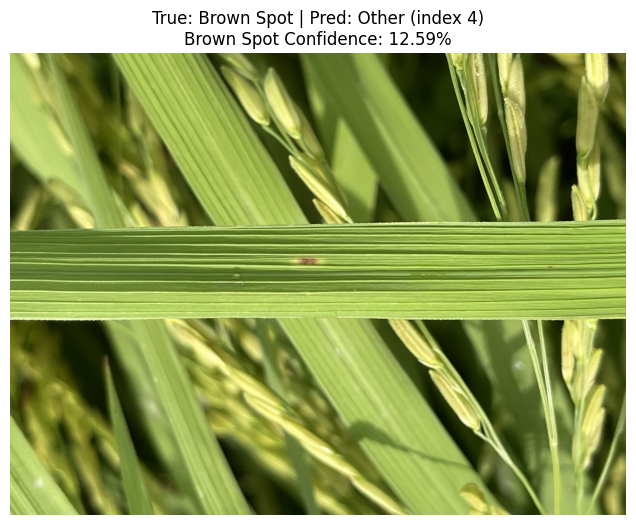

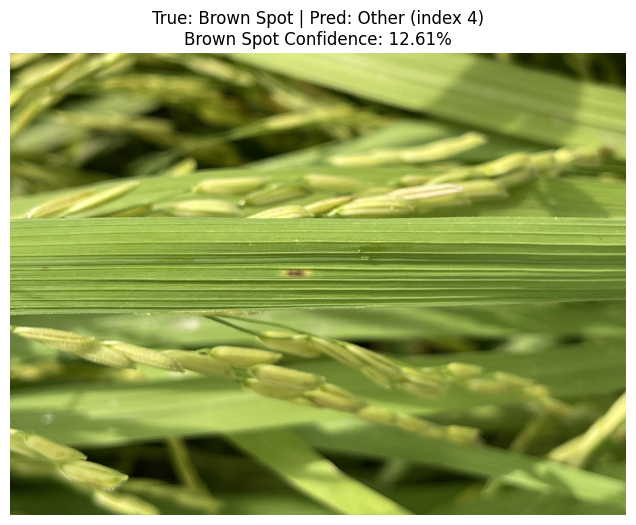

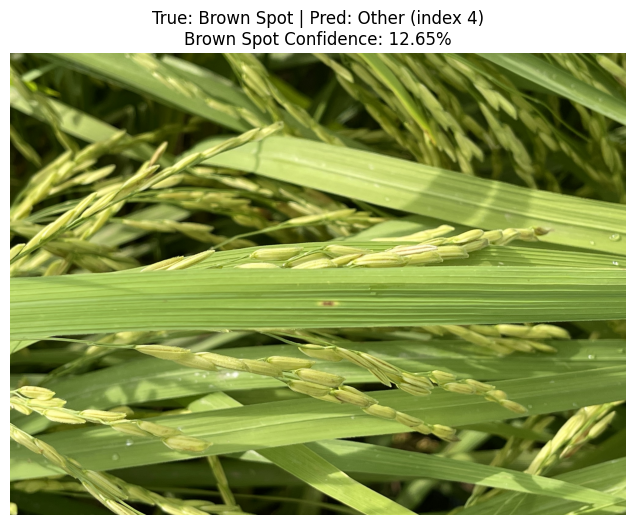

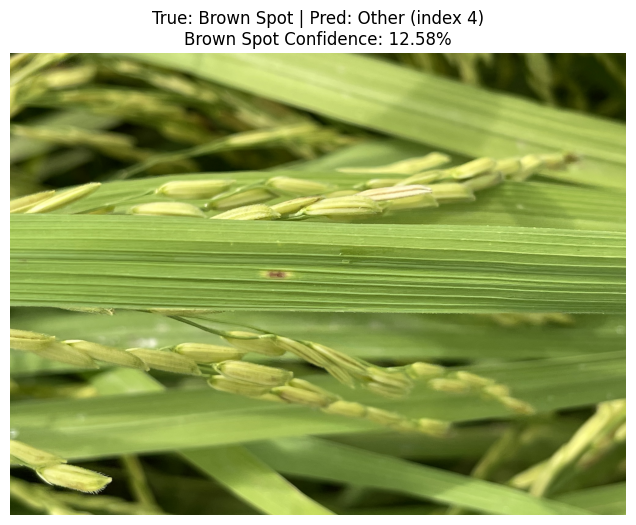

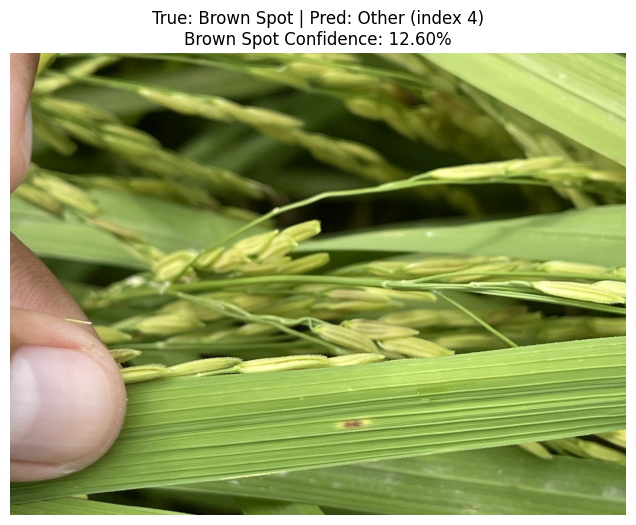

...

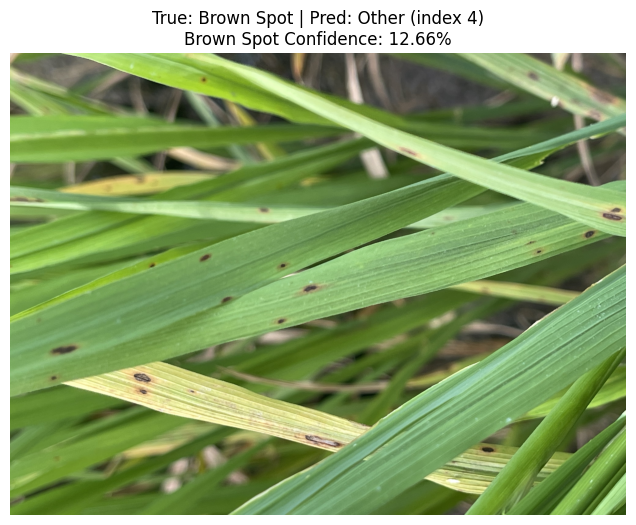

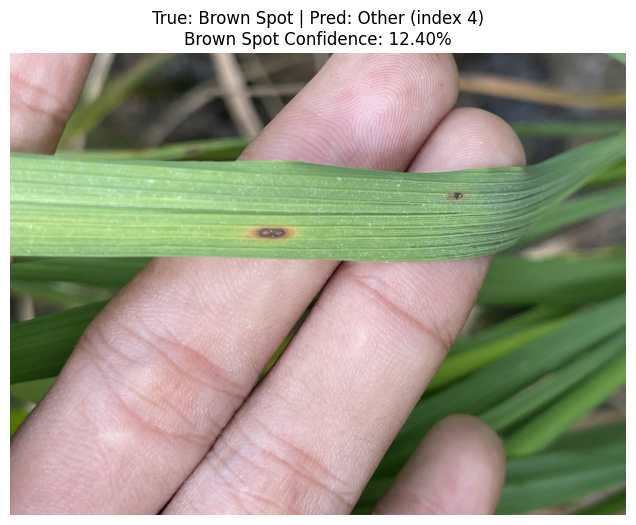

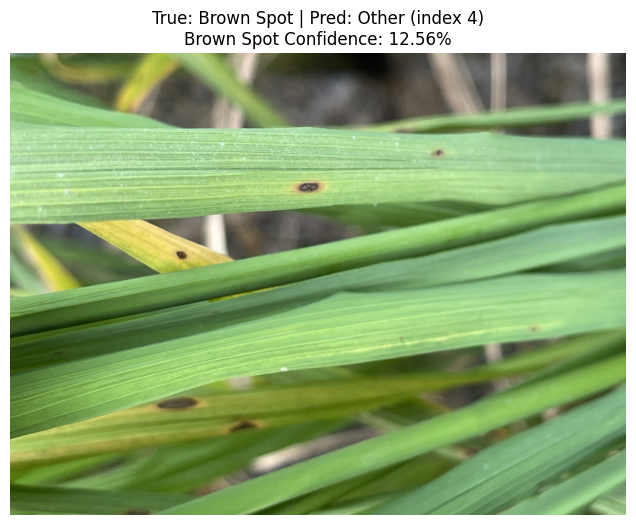

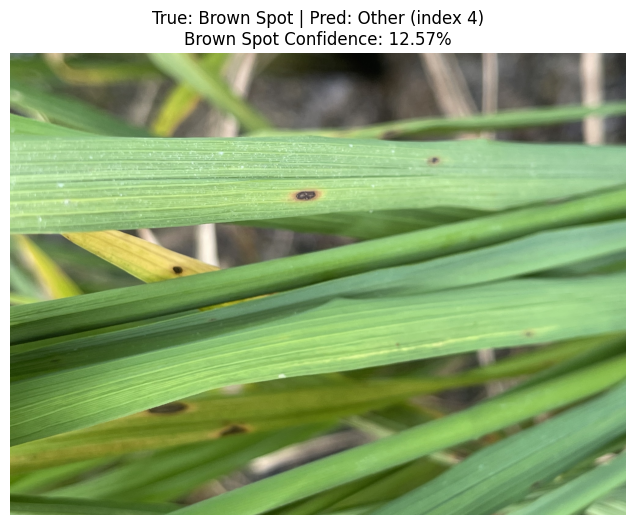

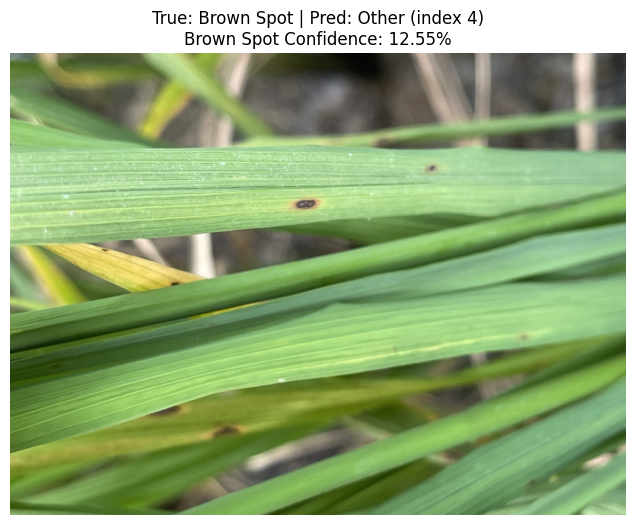


Found 13 total images
Batch size: 32
Number of batches: 1
Predicted on 13 samples
Accuracy (classified as Brown Spot): 0.00%
Correct Predictions: 0/13


In [9]:
import tensorflow as tf
import numpy as np
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Conv2D, BatchNormalization, Activation, Add, GlobalAveragePooling2D
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import os
import h5py

print(f"TensorFlow Version: {tf.__version__}")

class EnsembleLayer(tf.keras.layers.Layer):
    def __init__(self, ensemble_weights=None, **kwargs):
        super(EnsembleLayer, self).__init__(**kwargs)
        self.ensemble_weights = ensemble_weights if ensemble_weights is not None else []
    
    def build(self, input_shape):
        if not self.ensemble_weights:
            self.ensemble_weights = self.add_weight(
                name='ensemble_weights',
                shape=(len(input_shape) if isinstance(input_shape, list) else 1,),
                initializer='uniform',
                trainable=True
            )
    
    def call(self, inputs):
        if isinstance(inputs, list):
            if self.ensemble_weights is not None:
                weighted_outputs = [w * x for w, x in zip(self.ensemble_weights, inputs)]
                return tf.reduce_sum(weighted_outputs, axis=0)
            return tf.reduce_mean(inputs, axis=0)
        return inputs
    
    def get_config(self):
        config = super(EnsembleLayer, self).get_config()
        config.update({
            'ensemble_weights': self.ensemble_weights if isinstance(self.ensemble_weights, list) else self.ensemble_weights.numpy().tolist()
        })
        return config

def resnet_block(x, filters, kernel_size=3, stride=1, block_name=''):
    y = Conv2D(filters, kernel_size, strides=stride, padding='same', name=f'{block_name}_1_conv')(x)
    y = BatchNormalization(name=f'{block_name}_1_bn')(y)
    y = Activation('relu')(y)
    y = Conv2D(filters, kernel_size, padding='same', name=f'{block_name}_2_conv')(y)
    y = BatchNormalization(name=f'{block_name}_2_bn')(y)
    if stride > 1 or x.shape[-1] != filters:
        x = Conv2D(filters, 1, strides=stride, padding='same', name=f'{block_name}_0_conv')(x)
        x = BatchNormalization(name=f'{block_name}_0_bn')(x)
    out = Add()([x, y])
    out = Activation('relu')(out)
    return out

# Define model to match weights
input_layer = Input(shape=(224, 224, 3), name='input_8')
x = Conv2D(64, 7, strides=2, padding='same', name='conv1_conv')(input_layer)
x = BatchNormalization(name='conv1_bn')(x)
x = Activation('relu', name='activation_5')(x)
x = resnet_block(x, 256, block_name='conv3_block10')
x = resnet_block(x, 256, block_name='conv3_block11')
x = GlobalAveragePooling2D(name='pool3_pool')(x)
ensemble_output = EnsembleLayer(name='ensemble_layer_4')(x)
output = Dense(7, activation='softmax', name='predictions')(ensemble_output)
model = Model(inputs=input_layer, outputs=output)

MODEL_PATH = r'D:\CADT\CapstoneProjectI\ml__model\models\ensemble_model.h5'
TEST_DIR = r'D:\CADT\CapstoneProjectI\ml__model\data\testimg'

if not os.path.exists(MODEL_PATH):
    raise FileNotFoundError(f"Model file not found at: {MODEL_PATH}")
if not os.path.exists(TEST_DIR):
    raise FileNotFoundError(f"Test directory not found at: {TEST_DIR}")

print("Inspecting HDF5 file structure...")
with h5py.File(MODEL_PATH, 'r') as f:
    print("Top-level keys:", list(f.keys()))
    if 'model_weights' in f:
        print("Model weights found")
        print("Weight groups:", list(f['model_weights'].keys()))

# Try standard weight loading first
try:
    model.load_weights(MODEL_PATH, by_name=True, skip_mismatch=True)
    print("Weights loaded successfully (by name)")
except Exception as e:
    print(f"Standard loading failed: {e}")
    print("Attempting manual weight loading...")
    with h5py.File(MODEL_PATH, 'r') as f:
        weight_dict = {}
        def collect_weights(name, obj):
            if isinstance(obj, h5py.Dataset):
                weight_dict[name] = obj[()]
        f['model_weights'].visititems(collect_weights)
        
        # Map weights to model layers
        for layer in model.layers:
            layer_name = layer.name
            weights = []
            if isinstance(layer, (Conv2D, Dense)):
                kernel_key = f'model_weights/ensemble_layer_4/{layer_name}/kernel:0'
                if kernel_key in weight_dict:
                    weights.append(weight_dict[kernel_key])
                if isinstance(layer, Dense):
                    bias_key = f'model_weights/ensemble_layer_4/{layer_name}/bias:0'
                    if bias_key in weight_dict:
                        weights.append(weight_dict[bias_key])
            elif isinstance(layer, BatchNormalization):
                for param in ['gamma:0', 'beta:0', 'moving_mean:0', 'moving_variance:0']:
                    key = f'model_weights/ensemble_layer_4/{layer_name}/{param}'
                    if key in weight_dict:
                        weights.append(weight_dict[key])
            if weights:
                try:
                    layer.set_weights(weights)
                    print(f"Loaded weights for {layer_name}")
                except Exception as we:
                    print(f"Failed to set weights for {layer_name}: {we}")
    print("Manual weight loading completed")

model.summary()

class_names = ['Brown Spot']
target_class = 'Brown Spot'

class_dir = os.path.join(TEST_DIR, target_class)
if not os.path.exists(class_dir):
    print(f"Warning: Directory not found for {target_class}: {class_dir}")
else:
    num_images = len([f for f in os.listdir(class_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))])
    print(f"Found {num_images} images in {target_class} directory")

IMG_HEIGHT = 224
IMG_WIDTH = 224
BATCH_SIZE = 32

test_datagen = ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_directory(
    TEST_DIR,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False,
    classes=class_names
)

if test_generator.samples == 0:
    raise ValueError(f"No images found in {TEST_DIR}/{target_class}.")

predictions = model.predict(test_generator)
filenames = test_generator.filenames

brown_spot_index = 0  # Adjust this

results = []
misclassified = []

for i in range(len(filenames)):
    true_class = target_class
    pred_probs = predictions[i]
    brown_spot_confidence = pred_probs[brown_spot_index] * 100
    pred_idx = np.argmax(pred_probs)
    pred_class = 'Brown Spot' if pred_idx == brown_spot_index else 'Other'
    
    results.append({
        'filename': filenames[i],
        'true_class': true_class,
        'pred_class': pred_class,
        'brown_spot_confidence': brown_spot_confidence,
        'probs': pred_probs
    })
    
    if pred_idx != brown_spot_index:
        misclassified.append({
            'filename': filenames[i],
            'true_class': true_class,
            'pred_class': f"Other (index {pred_idx})",
            'brown_spot_confidence': brown_spot_confidence,
            'image': plt.imread(os.path.join(TEST_DIR, filenames[i]))
        })

print("\nPrediction Results:")
print("-" * 50)
for result in results:
    print(f"File: {result['filename']}")
    print(f"True Class: {result['true_class']}")
    print(f"Predicted Class: {result['pred_class']}")
    print(f"Brown Spot Confidence: {result['brown_spot_confidence']:.2f}%")
    print("All Class Probabilities:")
    for j, prob in enumerate(result['probs']):
        print(f"  Class {j}: {prob*100:.2f}%")
    print("-" * 50)

print(f"\nTotal misclassified images: {len(misclassified)}")
for i, misc in enumerate(misclassified):
    plt.figure(figsize=(8, 6))
    plt.imshow(misc['image'])
    plt.title(f"True: {misc['true_class']} | Pred: {misc['pred_class']}\nBrown Spot Confidence: {misc['brown_spot_confidence']:.2f}%")
    plt.axis('off')
    plt.show()

correct = len(results) - len(misclassified)
accuracy = (correct / len(results)) * 100
num_batches = np.ceil(test_generator.samples / BATCH_SIZE)
print(f"\nFound {test_generator.samples} total images")
print(f"Batch size: {BATCH_SIZE}")
print(f"Number of batches: {int(num_batches)}")
print(f"Predicted on {len(predictions)} samples")
print(f"Accuracy (classified as Brown Spot): {accuracy:.2f}%")
print(f"Correct Predictions: {correct}/{len(results)}")